# Adding White Noise to Audio Files

This notebook demonstrates how to add white noise to an audio file at different noise levels (25%, 50%, 75%, and 100%).

We'll use:
- **NumPy** for generating the noise
- **SciPy** for reading/writing audio files
- **Matplotlib** for visualization
- **IPython.display** for audio playback in the notebook

In [1]:
# Import necessary libraries
import numpy as np
import os
from scipy.io import wavfile
import matplotlib.pyplot as plt
from IPython.display import Audio, display
import librosa
import librosa.display

## 1. Define Functions for Adding White Noise

In [3]:
def add_white_noise(audio_data, sample_rate, noise_level):
    """
    Add white noise to audio data.
    
    Parameters:
    -----------
    audio_data : numpy.ndarray
        The audio signal
    sample_rate : int
        Sample rate of the audio
    noise_level : float
        Noise level to add (as a percentage of the signal power)
    
    Returns:
    --------
    numpy.ndarray
        Audio with added noise
    float
        Signal-to-noise ratio (SNR) in dB
    """
    # Ensure audio_data is float for processing
    if audio_data.dtype.kind not in 'fc':  # If not float or complex
        audio_data = audio_data.astype(np.float32)
        # Normalize to [-1, 1] if using PCM encoding
        if np.max(np.abs(audio_data)) > 1.0:
            max_val = np.iinfo(audio_data.dtype).max
            audio_data = audio_data / max_val
    
    # Calculate signal power
    signal_power = np.mean(audio_data**2)
    
    # Generate white noise with the same shape as the input
    noise = np.random.normal(0, 1, audio_data.shape)
    
    # Calculate the desired noise power based on the signal power and noise level
    target_noise_power = signal_power * noise_level
    current_noise_power = np.mean(noise**2)
    
    # Scale noise to desired power
    noise = noise * np.sqrt(target_noise_power / current_noise_power)
    
    # Add noise to the audio
    noisy_audio = audio_data + noise
    
    # Calculate signal-to-noise ratio (SNR) in dB
    snr_db = 10 * np.log10(signal_power / np.mean(noise**2))
    
    # Ensure the output stays within valid range [-1, 1]
    if np.max(np.abs(noisy_audio)) > 1.0:
        noisy_audio = np.clip(noisy_audio, -1.0, 1.0)
    
    return noisy_audio, snr_db

## 2. Load an Audio File

First, we need to load an audio file. You can either upload a file using the Jupyter interface or specify a path to an existing file.

In [6]:
# Specify the path to your WAV file
file_path = "./samples/2025-02-10_11-22-16.wav"  # Change this to your WAV file path

# If you want to upload a file using Jupyter's interface, uncomment the following:
# from google.colab import files
# uploaded = files.upload()
# file_path = next(iter(uploaded))

# Read the audio file
sample_rate, original_audio = wavfile.read(file_path)

# If stereo, convert to mono for simplicity
if len(original_audio.shape) > 1 and original_audio.shape[1] > 1:
    print(f"Converting from stereo to mono (original shape: {original_audio.shape})")
    original_audio = np.mean(original_audio, axis=1).astype(original_audio.dtype)

print(f"Loaded audio file: {file_path}")
print(f"Sample rate: {sample_rate} Hz")
print(f"Duration: {len(original_audio) / sample_rate:.2f} seconds")
print(f"Data type: {original_audio.dtype}")

Loaded audio file: ./samples/2025-02-10_11-22-16.wav
Sample rate: 48100 Hz
Duration: 9.98 seconds
Data type: int16


## 3. Listen to the Original Audio

In [7]:
# Normalize for audio playback if needed
if original_audio.dtype != np.float32 and original_audio.dtype != np.float64:
    normalized_audio = original_audio / np.iinfo(original_audio.dtype).max
else:
    normalized_audio = original_audio

# Display audio player
display(Audio(normalized_audio, rate=sample_rate))

## 4. Visualize the Original Audio

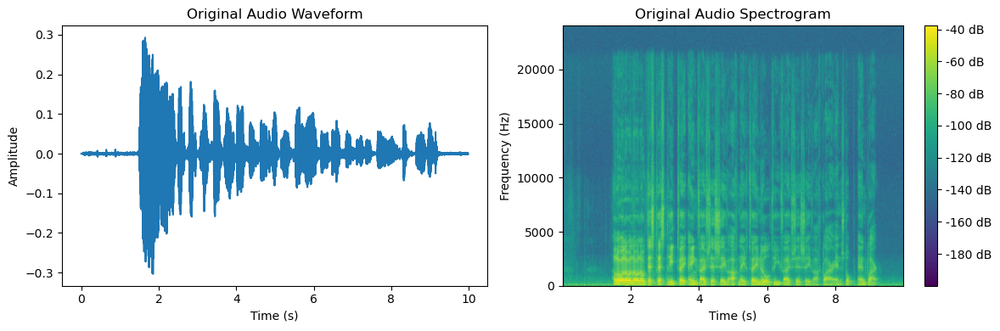

In [8]:
# Plot waveform
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.title("Original Audio Waveform")
time = np.arange(0, len(original_audio)) / sample_rate
plt.plot(time, normalized_audio)
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")

# Plot spectrogram
plt.subplot(1, 2, 2)
plt.title("Original Audio Spectrogram")
plt.specgram(normalized_audio, Fs=sample_rate, NFFT=1024, noverlap=512, cmap="viridis")
plt.xlabel("Time (s)")
plt.ylabel("Frequency (Hz)")
plt.colorbar(format="%+2.0f dB")

plt.tight_layout()
plt.show()

## 5. Iteratively Add White Noise

Now we'll add white noise at different levels: 25%, 50%, 75%, and 100%.

In [9]:
# Define noise levels
noise_levels = [0.25, 0.50, 0.75, 1.0]

# Create a folder for output files
output_dir = "noisy_audio_output"
os.makedirs(output_dir, exist_ok=True)

# Store original and processed audio for comparison
audio_samples = {
    "Original": normalized_audio
}

# Process each noise level
for noise_level in noise_levels:
    # Apply noise
    noisy_audio, snr_db = add_white_noise(normalized_audio, sample_rate, noise_level)
    
    # Store for later comparison
    noise_percent = int(noise_level * 100)
    audio_samples[f"{noise_percent}% Noise (SNR: {snr_db:.2f} dB)"] = noisy_audio
    
    # Save as WAV file
    output_file = os.path.join(output_dir, f"noise_{noise_percent}pct.wav")
    wavfile.write(output_file, sample_rate, noisy_audio)
    print(f"Created {output_file} with {noise_percent}% noise (SNR: {snr_db:.2f} dB)")

Created noisy_audio_output/noise_25pct.wav with 25% noise (SNR: 6.02 dB)
Created noisy_audio_output/noise_50pct.wav with 50% noise (SNR: 3.01 dB)
Created noisy_audio_output/noise_75pct.wav with 75% noise (SNR: 1.25 dB)
Created noisy_audio_output/noise_100pct.wav with 100% noise (SNR: -0.00 dB)


## 6. Compare Waveforms

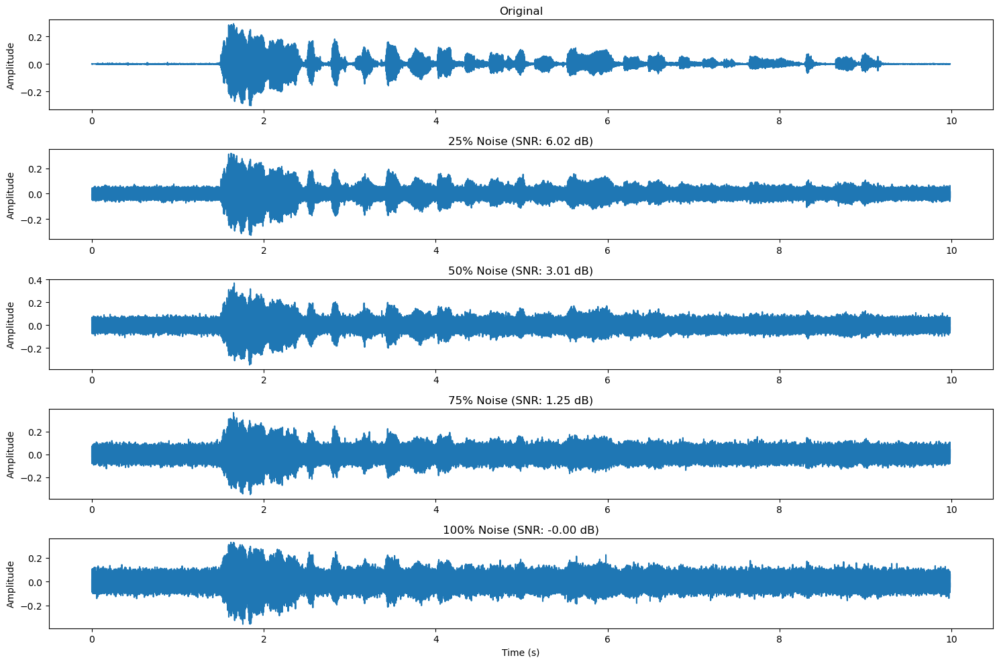

In [10]:
plt.figure(figsize=(15, 10))

# Plot each audio sample
for i, (label, audio) in enumerate(audio_samples.items()):
    plt.subplot(len(audio_samples), 1, i+1)
    plt.title(label)
    time = np.arange(0, len(audio)) / sample_rate
    plt.plot(time, audio)
    plt.ylabel("Amplitude")
    if i == len(audio_samples) - 1:  # Only add x-label for the last subplot
        plt.xlabel("Time (s)")

plt.tight_layout()
plt.savefig(os.path.join(output_dir, "waveform_comparison.png"))
plt.show()

## 7. Compare Spectrograms

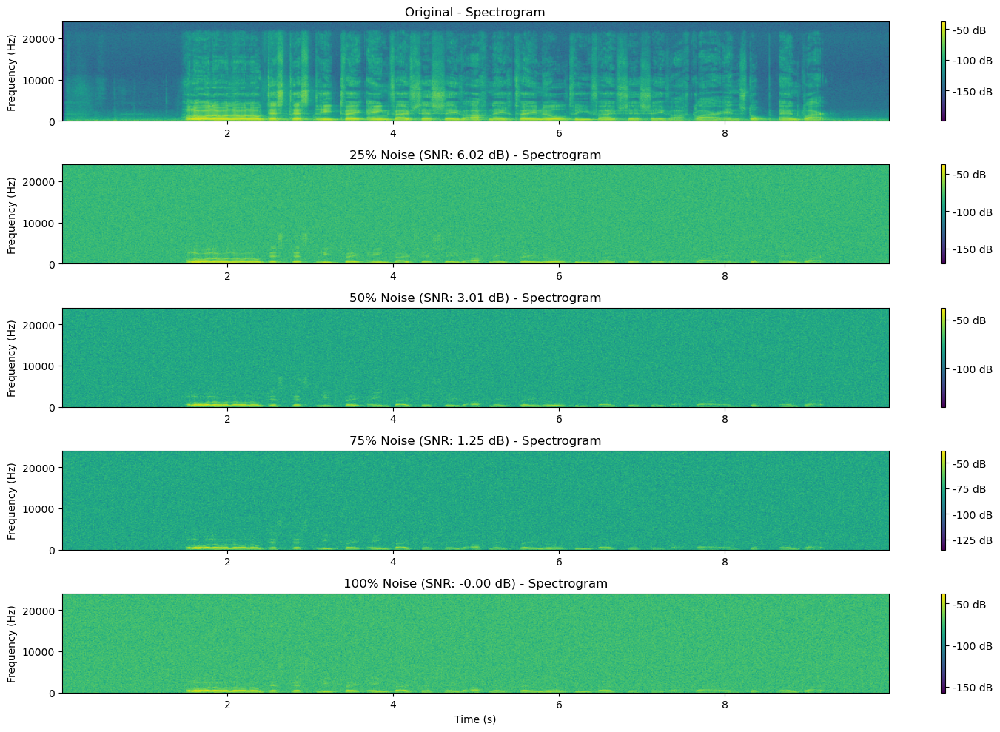

In [11]:
plt.figure(figsize=(15, 10))

# Plot spectrogram for each audio sample
for i, (label, audio) in enumerate(audio_samples.items()):
    plt.subplot(len(audio_samples), 1, i+1)
    plt.title(f"{label} - Spectrogram")
    plt.specgram(audio, Fs=sample_rate, NFFT=1024, noverlap=512, cmap="viridis")
    plt.ylabel("Frequency (Hz)")
    if i == len(audio_samples) - 1:  # Only add x-label for the last subplot
        plt.xlabel("Time (s)")
    plt.colorbar(format="%+2.0f dB")

plt.tight_layout()
plt.savefig(os.path.join(output_dir, "spectrogram_comparison.png"))
plt.show()

## 8. Listen to the Audio at Different Noise Levels

In [12]:
# Create audio players for each version
for label, audio in audio_samples.items():
    print(f"\n{label}:")
    display(Audio(audio, rate=sample_rate))


Original:



25% Noise (SNR: 6.02 dB):



50% Noise (SNR: 3.01 dB):



75% Noise (SNR: 1.25 dB):



100% Noise (SNR: -0.00 dB):


## 9. Advanced Analysis: Mel Spectrograms

Let's also visualize the mel spectrograms, which are often used in audio processing and machine learning.

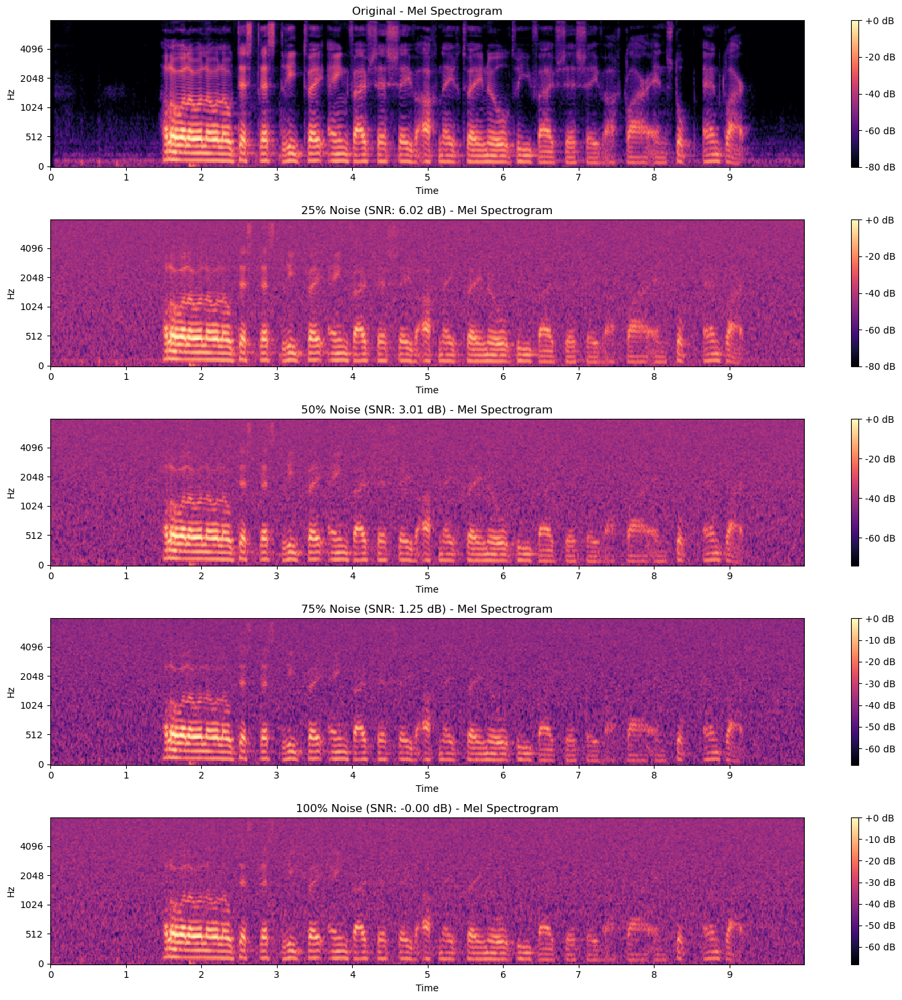

In [13]:
plt.figure(figsize=(15, 15))

for i, (label, audio) in enumerate(audio_samples.items()):
    # Convert to librosa format if necessary
    y = audio.astype(np.float32)
    
    # Compute mel spectrogram
    mel_spec = librosa.feature.melspectrogram(y=y, sr=sample_rate, n_mels=128, fmax=8000)
    mel_spec_db = librosa.power_to_db(mel_spec, ref=np.max)
    
    # Plot
    plt.subplot(len(audio_samples), 1, i+1)
    plt.title(f"{label} - Mel Spectrogram")
    librosa.display.specshow(mel_spec_db, sr=sample_rate, x_axis='time', y_axis='mel', fmax=8000)
    plt.colorbar(format='%+2.0f dB')

plt.tight_layout()
plt.savefig(os.path.join(output_dir, "mel_spectrogram_comparison.png"))
plt.show()

## 10. Calculate Signal-to-Noise Ratio (SNR) for Each Level

In [ ]:
# Extract only the noisy samples (skip the original)
noise_samples = {k: v for k, v in audio_samples.items() if k != "Original"}

# Calculate SNR for each sample compared to original
original_power = np.mean(audio_samples["Original"]**2)

# Create table data
snr_data = []
for label, noisy in noise_samples.items():
    # Extract noise by subtracting original from noisy
    noise = noisy - audio_samples["Original"]
    noise_power = np.mean(noise**2)
    
    # Calculate SNR
    snr = 10 * np.log10(original_power / noise_power)
    noise_percent = label.split('%')[0]
    
    snr_data.append([noise_percent, f"{snr:.2f} dB"])

# Display as a table
from IPython.display import HTML, display
import pandas as pd

df = pd.DataFrame(snr_data, columns=['Noise Level (%)', 'SNR (dB)'])
display(HTML(df.to_html(index=False)))

## 11. Export All Files

All the audio files have been saved to the `noisy_audio_output` directory. If you're using Google Colab and want to download all files, you can run:

In [ ]:
# If running in Google Colab, this will create a zip file of all outputs
# Uncomment to use

# !zip -r noisy_audio_files.zip {output_dir}
# from google.colab import files
# files.download('noisy_audio_files.zip')

## 12. Create a Function to Test Custom Noise Levels

Let's create an interactive function to test any noise level between 0% and 100%.

In [ ]:
from ipywidgets import interact, FloatSlider

def test_noise_level(noise_level):
    # Apply noise
    noisy_audio, snr_db = add_white_noise(normalized_audio, sample_rate, noise_level)
    
    # Create a figure with waveform and spectrogram
    plt.figure(figsize=(12, 8))
    
    # Waveform
    plt.subplot(2, 1, 1)
    plt.title(f"Waveform with {noise_level*100:.0f}% Noise (SNR: {snr_db:.2f} dB)")
    time = np.arange(0, len(noisy_audio)) / sample_rate
    plt.plot(time, noisy_audio)
    plt.ylabel("Amplitude")
    
    # Spectrogram
    plt.subplot(2, 1, 2)
    plt.title(f"Spectrogram with {noise_level*100:.0f}% Noise")
    plt.specgram(noisy_audio, Fs=sample_rate, NFFT=1024, noverlap=512, cmap="viridis")
    plt.ylabel("Frequency (Hz)")
    plt.xlabel("Time (s)")
    plt.colorbar(format="%+2.0f dB")
    
    plt.tight_layout()
    plt.show()
    
    # Display audio player
    display(Audio(noisy_audio, rate=sample_rate))

# Create an interactive slider
interact(test_noise_level, 
         noise_level=FloatSlider(min=0, max=2.0, step=0.05, value=0.5, 
                                description="Noise Level:", 
                                layout={'width': '500px'}))